In [243]:
import tslearn as ts
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tslearn.utils import to_time_series_dataset
from tslearn.clustering import TimeSeriesKMeans
from scipy.spatial.distance import cdist
import time

In [10]:
with open('/home/wooseok/WISE_data/3rdnewwise/AAS_wise_mrt1.txt', 'r') as w:
    for line in w:
            line = line.rstrip()
            print(line)
    
# s.rstrip()

Title: Quantifying Variability of YSOs in the Mid-IR Over Six Years with NEOWISE
Authors: Park W., Lee J.-E., Peña C.C., Johnstone D., Herczeg G.J.,
         Lee S., Lee S., Bhardwaj A., Moriarty-Schieven G.H.
Table: Multi-epoch NEOWISE photometry
Byte-by-byte Description of file: AAS_wise_mrt1.txt
--------------------------------------------------------------------------------
   Bytes Format Units   Label  Explanations
--------------------------------------------------------------------------------
   1-  5 A5     ---     Index  Index (1)
   7- 15 F9.3   d       MJD    Modified Julian Date
  17- 21 F5.2   mag     mag    Magnitude
  23- 27 F5.3   mag   e_mag    Uncertainty in magnitude
  29- 30 A2     ---     Band   NEOWISE band
--------------------------------------------------------------------------------
Note (1): M, D, and EL are used for the YSOs listed in Megeath et al. (2012),
          Dunham et al. (2015), and Esplin & Luhman (2019),respectively.
          For M and D, sourc

M192  56915.802  9.23 0.017 W1
M192  57088.907  9.27 0.061 W1
M192  57283.246  9.25 0.063 W1
M192  57448.001  9.21 0.047 W1
M192  57647.191  9.38 0.015 W1
M192  57812.248  9.47 0.038 W1
M192  58014.376  9.33 0.064 W1
M192  58169.832  9.26 0.044 W1
M192  58378.518  9.32 0.081 W1
M192  58536.286  9.26 0.078 W1
M192  58743.580  9.30 0.052 W1
M192  58900.385  9.14 0.038 W1
M192  59110.105  9.45 0.015 W1
M192  56915.802  8.84 0.040 W2
M192  57088.915  8.89 0.058 W2
M192  57283.136  8.84 0.046 W2
M192  57448.001  8.70 0.050 W2
M192  57647.322  8.85 0.040 W2
M192  57812.784  8.98 0.045 W2
M192  58014.335  8.82 0.051 W2
M192  58169.841  8.78 0.053 W2
M192  58378.472  8.92 0.051 W2
M192  58536.371  8.83 0.057 W2
M192  58743.580  8.80 0.084 W2
M192  58900.469  8.64 0.051 W2
M192  59110.236  8.85 0.040 W2
M193  56729.766 12.07 0.043 W1
M193  56920.373 12.08 0.036 W1
M193  57088.894 12.07 0.042 W1
M193  57283.106 12.16 0.051 W1
M193  57448.020 12.06 0.039 W1
M193  57647.334 12.15 0.037 W1
M193  57

M420  57089.071 11.12 0.034 W2
M420  57283.399 11.03 0.035 W2
M420  57448.102 10.89 0.035 W2
M420  57648.632 10.99 0.042 W2
M420  57812.387 11.05 0.047 W2
M420  58014.687 10.97 0.041 W2
M420  58169.555 11.12 0.040 W2
M420  58378.696 11.01 0.061 W2
M420  58536.458 10.95 0.033 W2
M420  58742.940 10.99 0.040 W2
M420  58900.760 10.98 0.041 W2
M420  59109.981 11.17 0.056 W2
M421  56729.345  8.33 0.036 W1
M421  56921.213  8.34 0.035 W1
M421  57088.782  8.26 0.042 W1
M421  57283.057  8.22 0.039 W1
M421  57447.785  8.43 0.038 W1
M421  57647.775  8.05 0.045 W1
M421  57812.134  8.10 0.039 W1
M421  58014.237  8.25 0.039 W1
M421  58169.222  8.19 0.042 W1
M421  58378.518  8.49 0.041 W1
M421  58536.168  8.32 0.038 W1
M421  58742.661  8.22 0.039 W1
M421  58900.387  8.42 0.036 W1
M421  59109.858  8.30 0.036 W1
M421  56729.285  7.08 0.047 W2
M421  56921.201  7.09 0.048 W2
M421  57088.868  6.98 0.049 W2
M421  57283.009  6.95 0.055 W2
M421  57447.778  7.08 0.047 W2
M421  57647.808  6.66 0.068 W2
M421  57

M642  58742.269 12.39 0.057 W2
M642  58900.077 12.39 0.068 W2
M642  59109.391 12.56 0.097 W2
M643  56728.950 11.52 0.023 W1
M643  56920.280 11.55 0.022 W1
M643  57088.568 11.37 0.023 W1
M643  57282.836 11.67 0.025 W1
M643  57447.619 11.64 0.025 W1
M643  57646.947 11.55 0.026 W1
M643  57811.909 11.61 0.034 W1
M643  58013.942 11.56 0.028 W1
M643  58169.372 11.56 0.028 W1
M643  58378.080 11.53 0.023 W1
M643  58535.946 11.61 0.025 W1
M643  58742.820 11.50 0.029 W1
M643  58900.029 11.59 0.025 W1
M643  59109.463 11.46 0.026 W1
M643  56728.996 10.64 0.026 W2
M643  56920.310 10.70 0.025 W2
M643  57088.553 10.50 0.024 W2
M643  57282.764 10.83 0.028 W2
M643  57447.619 10.75 0.023 W2
M643  57646.982 10.68 0.028 W2
M643  57811.879 10.72 0.033 W2
M643  58013.870 10.73 0.029 W2
M643  58169.416 10.72 0.025 W2
M643  58378.015 10.70 0.023 W2
M643  58535.952 10.75 0.024 W2
M643  58742.341 10.60 0.029 W2
M643  58900.065 10.74 0.025 W2
M643  59109.469 10.60 0.030 W2
M644  56729.469 10.31 0.017 W1
M644  56

M860  56919.196 10.42 0.026 W1
M860  57087.473 10.55 0.032 W1
M860  57281.727 10.41 0.023 W1
M860  57446.578 10.41 0.025 W1
M860  57645.831 10.48 0.025 W1
M860  57810.838 10.49 0.020 W1
M860  58012.914 10.60 0.026 W1
M860  58167.848 10.70 0.022 W1
M860  58377.072 10.60 0.025 W1
M860  58534.946 10.53 0.017 W1
M860  58741.787 10.41 0.025 W1
M860  58899.096 10.59 0.019 W1
M860  59108.519 10.74 0.022 W1
M860  56728.028  9.81 0.028 W2
M860  56919.130  9.88 0.020 W2
M860  57087.473 10.04 0.026 W2
M860  57281.637  9.92 0.020 W2
M860  57446.498  9.91 0.027 W2
M860  57645.886  9.98 0.022 W2
M860  57810.688  9.98 0.026 W2
M860  58013.012 10.14 0.033 W2
M860  58167.776 10.21 0.030 W2
M860  58376.989 10.09 0.022 W2
M860  58534.932 10.05 0.019 W2
M860  58741.852  9.95 0.022 W2
M860  58898.921 10.13 0.020 W2
M860  59108.453 10.26 0.030 W2
M861  56727.666 12.42 0.034 W1
M861  56919.515 12.47 0.038 W1
M861  57087.549 12.35 0.040 W1
M861  57281.858 12.57 0.034 W1
M861  57446.848 12.56 0.045 W1
M861  57

M1095 56919.636 12.17 0.033 W1
M1095 57087.612 11.52 0.043 W1
M1095 57281.750 11.63 0.032 W1
M1095 57446.687 12.02 0.034 W1
M1095 57646.825 11.85 0.038 W1
M1095 57810.891 11.69 0.028 W1
M1095 58013.163 11.78 0.045 W1
M1095 58168.706 11.88 0.039 W1
M1095 58377.262 11.93 0.031 W1
M1095 58535.104 12.00 0.044 W1
M1095 58741.525 12.05 0.037 W1
M1095 58899.215 11.97 0.041 W1
M1095 59108.646 12.01 0.062 W1
M1095 56728.018 11.88 0.048 W2
M1095 56919.583 11.89 0.051 W2
M1095 57087.612 11.11 0.036 W2
M1095 57281.732 11.23 0.036 W2
M1095 57446.746 11.65 0.046 W2
M1095 57646.875 11.48 0.035 W2
M1095 57810.917 11.28 0.037 W2
M1095 58013.215 11.40 0.051 W2
M1095 58168.653 11.51 0.034 W2
M1095 58377.369 11.59 0.043 W2
M1095 58535.120 11.66 0.048 W2
M1095 58741.454 11.70 0.051 W2
M1095 58899.268 11.57 0.058 W2
M1095 59108.627 11.62 0.048 W2
M1096 56728.319 11.42 0.037 W1
M1096 56919.012 11.58 0.081 W1
M1096 57087.548 11.32 0.028 W1
M1096 57281.669 11.56 0.053 W1
M1096 57446.513 11.54 0.047 W1
M1096 57

M1333 57281.787 10.42 0.025 W1
M1333 57446.658 10.42 0.020 W1
M1333 57646.680 10.43 0.022 W1
M1333 57811.516 10.42 0.021 W1
M1333 58012.940 10.43 0.024 W1
M1333 58167.986 10.43 0.022 W1
M1333 58377.069 10.46 0.022 W1
M1333 58534.973 10.43 0.022 W1
M1333 58741.319 10.45 0.023 W1
M1333 58899.030 10.44 0.021 W1
M1333 59108.459 10.46 0.024 W1
M1333 56727.896 10.17 0.026 W2
M1333 56919.419 10.16 0.022 W2
M1333 57087.515 10.18 0.021 W2
M1333 57281.767 10.17 0.029 W2
M1333 57446.527 10.15 0.022 W2
M1333 57646.640 10.17 0.023 W2
M1333 57811.552 10.17 0.022 W2
M1333 58012.979 10.17 0.023 W2
M1333 58168.457 10.17 0.025 W2
M1333 58377.033 10.19 0.021 W2
M1333 58534.914 10.18 0.029 W2
M1333 58741.927 10.20 0.023 W2
M1333 58899.076 10.17 0.024 W2
M1333 59108.437 10.19 0.022 W2
M1334 56727.501  7.92 0.040 W1
M1334 56919.537  7.87 0.045 W1
M1334 57087.598  7.74 0.046 W1
M1334 57281.798  7.92 0.044 W1
M1334 57446.626  7.91 0.039 W1
M1334 57646.870  7.70 0.051 W1
M1334 57810.957  7.89 0.044 W1
M1334 58

M1585 56919.452 10.43 0.049 W2
M1585 57087.653 10.44 0.064 W2
M1585 57281.698 10.50 0.064 W2
M1585 57446.704 10.44 0.056 W2
M1585 57645.952 10.28 0.053 W2
M1585 57811.499 10.30 0.037 W2
M1585 58013.064 10.41 0.063 W2
M1585 58168.536 10.47 0.051 W2
M1585 58377.103 10.48 0.051 W2
M1585 58534.866 10.39 0.052 W2
M1585 58741.343 10.31 0.049 W2
M1585 58899.153 10.33 0.046 W2
M1585 59108.522 10.32 0.048 W2
M1587 56728.555 12.22 0.052 W1
M1587 56919.412 12.29 0.069 W1
M1587 57087.430 12.30 0.128 W1
M1587 57281.685 12.26 0.124 W1
M1587 57446.746 12.25 0.125 W1
M1587 57646.666 12.25 0.091 W1
M1587 57810.779 12.26 0.094 W1
M1587 58012.934 12.26 0.082 W1
M1587 58167.923 12.21 0.075 W1
M1587 58377.067 12.31 0.068 W1
M1587 58534.855 12.25 0.097 W1
M1587 58741.899 12.22 0.097 W1
M1587 58899.031 12.22 0.088 W1
M1587 59108.587 12.21 0.113 W1
M1587 56727.391 11.84 0.113 W2
M1587 56919.404 11.92 0.094 W2
M1587 57087.539 11.88 0.098 W2
M1587 57281.726 11.94 0.114 W2
M1587 57446.675 11.93 0.094 W2
M1587 57

M2201 57087.653  6.85 0.153 W1
M2201 57281.708  6.87 0.197 W1
M2201 57446.792  6.90 0.139 W1
M2201 57646.650  6.86 0.150 W1
M2201 57811.657  6.71 0.143 W1
M2201 58013.101  6.65 0.135 W1
M2201 58168.525  6.64 0.189 W1
M2201 58377.215  6.65 0.197 W1
M2201 58535.016  6.60 0.146 W1
M2201 58741.423  6.59 0.147 W1
M2201 58899.118  6.82 0.172 W1
M2201 59108.549  6.84 0.173 W1
M2201 56727.080  6.75 0.063 W2
M2201 56919.452  6.68 0.066 W2
M2201 57087.647  6.74 0.065 W2
M2201 57281.792  6.67 0.071 W2
M2201 57446.876  6.83 0.057 W2
M2201 57646.677  6.71 0.065 W2
M2201 57811.677  6.63 0.070 W2
M2201 58013.109  6.56 0.082 W2
M2201 58167.972  6.49 0.085 W2
M2201 58377.149  6.53 0.079 W2
M2201 58535.025  6.56 0.082 W2
M2201 58741.379  6.58 0.084 W2
M2201 58899.089  6.66 0.072 W2
M2201 59108.513  6.76 0.062 W2
M2202 56727.080 11.37 0.111 W1
M2202 56919.465 11.48 0.113 W1
M2202 57087.581 11.48 0.136 W1
M2202 57281.729 11.38 0.147 W1
M2202 57446.676 11.40 0.146 W1
M2202 57646.896 11.47 0.174 W1
M2202 57

M2476 58168.123  9.40 0.029 W2
M2476 58377.182  9.60 0.027 W2
M2476 58534.891  9.71 0.023 W2
M2476 58741.466  9.54 0.032 W2
M2476 58899.161  9.45 0.033 W2
M2476 59108.476  9.51 0.029 W2
M2478 56728.197 12.52 0.056 W1
M2478 56919.718 12.61 0.063 W1
M2478 57087.802 12.59 0.052 W1
M2478 57282.010 12.59 0.063 W1
M2478 57446.854 12.58 0.063 W1
M2478 57647.033 12.63 0.069 W1
M2478 57811.853 12.62 0.065 W1
M2478 58013.373 12.64 0.082 W1
M2478 58168.343 12.62 0.061 W1
M2478 58377.424 12.59 0.063 W1
M2478 58535.210 12.56 0.050 W1
M2478 58741.632 12.59 0.078 W1
M2478 58899.329 12.57 0.057 W1
M2478 59108.854 12.58 0.047 W1
M2478 56728.818 12.71 0.102 W2
M2478 56919.646 12.69 0.098 W2
M2478 57087.831 12.66 0.102 W2
M2478 57281.983 12.78 0.129 W2
M2478 57446.854 12.65 0.091 W2
M2478 57647.033 12.70 0.107 W2
M2478 57811.762 12.70 0.111 W2
M2478 58013.260 12.76 0.124 W2
M2478 58168.306 12.65 0.138 W2
M2478 58377.470 12.73 0.124 W2
M2478 58535.218 12.76 0.114 W2
M2478 58741.670 12.74 0.110 W2
M2478 58

M2686 57811.000 11.75 0.068 W1
M2686 58013.261 11.81 0.068 W1
M2686 58168.296 11.89 0.061 W1
M2686 58377.482 11.69 0.073 W1
M2686 58535.325 11.77 0.063 W1
M2686 58742.143 11.57 0.073 W1
M2686 58899.325 11.66 0.059 W1
M2686 59108.849 11.80 0.068 W1
M2686 56728.720 11.27 0.050 W2
M2686 56919.854 11.37 0.058 W2
M2686 57087.798 11.24 0.036 W2
M2686 57281.855 11.36 0.044 W2
M2686 57446.907 11.26 0.034 W2
M2686 57646.946 11.22 0.038 W2
M2686 57812.170 11.32 0.041 W2
M2686 58013.365 11.25 0.040 W2
M2686 58168.315 11.35 0.041 W2
M2686 58377.530 11.20 0.048 W2
M2686 58535.210 11.22 0.038 W2
M2686 58742.108 11.12 0.036 W2
M2686 58899.332 11.20 0.037 W2
M2686 59108.731 11.39 0.043 W2
M2687 56728.781 10.82 0.028 W1
M2687 56920.126 10.69 0.024 W1
M2687 57087.817 10.66 0.024 W1
M2687 57282.057 10.61 0.025 W1
M2687 57446.890 10.67 0.025 W1
M2687 57646.904 10.53 0.033 W1
M2687 57811.974 10.64 0.031 W1
M2687 58013.336 10.67 0.028 W1
M2687 58168.315 10.70 0.027 W1
M2687 58377.429 10.73 0.031 W1
M2687 58

M2903 58170.186  9.46 0.021 W1
M2903 58379.118  9.41 0.021 W1
M2903 58536.779  9.46 0.022 W1
M2903 58743.697  9.48 0.031 W1
M2903 58901.051  9.59 0.025 W1
M2903 59110.431  9.44 0.020 W1
M2903 56730.381  8.81 0.049 W2
M2903 56921.770  8.72 0.043 W2
M2903 57089.506  8.73 0.042 W2
M2903 57283.806  8.63 0.046 W2
M2903 57448.553  8.66 0.043 W2
M2903 57647.887  8.43 0.043 W2
M2903 57812.805  8.62 0.041 W2
M2903 58014.927  8.73 0.041 W2
M2903 58170.284  8.68 0.042 W2
M2903 58379.118  8.61 0.042 W2
M2903 58536.888  8.64 0.041 W2
M2903 58743.713  8.68 0.043 W2
M2903 58901.026  8.77 0.047 W2
M2903 59110.447  8.72 0.043 W2
M2904 56730.333  8.66 0.040 W1
M2904 56921.837  8.71 0.039 W1
M2904 57089.364  8.48 0.035 W1
M2904 57283.667  8.62 0.042 W1
M2904 57448.659  8.70 0.038 W1
M2904 57647.899  8.72 0.061 W1
M2904 57812.717  8.80 0.049 W1
M2904 58014.897  8.76 0.044 W1
M2904 58169.767  8.75 0.048 W1
M2904 58378.994  8.79 0.043 W1
M2904 58536.797  8.91 0.045 W1
M2904 58743.299  8.77 0.044 W1
M2904 58

M3258 57090.816  8.76 0.035 W1
M3258 57284.849  8.96 0.038 W1
M3258 57449.824  8.90 0.038 W1
M3258 57649.155  8.95 0.036 W1
M3258 57814.025  8.89 0.035 W1
M3258 58016.163  8.87 0.037 W1
M3258 58171.194  9.00 0.029 W1
M3258 58380.217  8.89 0.038 W1
M3258 58538.024  9.00 0.030 W1
M3258 58744.920  9.00 0.027 W1
M3258 58902.236  8.97 0.036 W1
M3258 59111.644  8.97 0.037 W1
M3258 56731.611  8.46 0.042 W2
M3258 56923.093  8.52 0.043 W2
M3258 57090.744  8.14 0.043 W2
M3258 57284.921  8.37 0.043 W2
M3258 57449.818  8.30 0.043 W2
M3258 57649.131  8.35 0.042 W2
M3258 57814.074  8.25 0.042 W2
M3258 58016.228  8.24 0.043 W2
M3258 58170.990  8.40 0.043 W2
M3258 58380.211  8.30 0.042 W2
M3258 58537.926  8.45 0.041 W2
M3258 58744.634  8.44 0.042 W2
M3258 58902.261  8.45 0.042 W2
M3258 59111.622  8.44 0.044 W2
M3259 56731.639 10.00 0.031 W1
M3259 56923.101  9.89 0.041 W1
M3259 57090.819  9.99 0.029 W1
M3259 57285.013 10.15 0.039 W1
M3259 57449.839 10.14 0.030 W1
M3259 57649.738  9.96 0.032 W1
M3259 57

D25   58199.905  6.19 0.190 W1
D25   58363.918  6.28 0.173 W1
D25   58564.138  6.23 0.175 W1
D25   58728.461  6.25 0.189 W1
D25   58931.187  6.16 0.204 W1
D25   59095.152  6.03 0.201 W1
D25   56741.357  6.11 0.125 W2
D25   56922.023  6.14 0.118 W2
D25   57104.443  6.07 0.127 W2
D25   57281.483  6.09 0.118 W2
D25   57468.601  6.10 0.133 W2
D25   57641.121  6.15 0.120 W2
D25   57835.108  6.18 0.120 W2
D25   58003.450  6.04 0.147 W2
D25   58199.917  5.95 0.135 W2
D25   58363.962  6.18 0.136 W2
D25   58564.708  6.19 0.122 W2
D25   58728.432  6.19 0.146 W2
D25   58931.055  6.05 0.126 W2
D25   59095.184  6.00 0.151 W2
D26   56741.840  8.10 0.042 W1
D26   56922.033  8.12 0.047 W1
D26   57104.308  8.14 0.041 W1
D26   57281.561  8.17 0.045 W1
D26   57468.562  8.15 0.040 W1
D26   57641.622  8.17 0.039 W1
D26   57834.980  8.13 0.037 W1
D26   58003.370  8.23 0.045 W1
D26   58199.904  8.13 0.038 W1
D26   58363.817  8.19 0.046 W1
D26   58564.684  8.12 0.037 W1
D26   58727.957  8.09 0.050 W1
D26   58

D254  56747.848 12.77 0.053 W1
D254  56928.103 12.77 0.052 W1
D254  57109.782 12.73 0.035 W1
D254  57288.469 12.73 0.037 W1
D254  57474.059 12.75 0.055 W1
D254  57648.257 12.75 0.042 W1
D254  57841.172 12.74 0.041 W1
D254  58008.848 12.73 0.049 W1
D254  58205.216 12.77 0.047 W1
D254  58369.295 12.76 0.052 W1
D254  58570.765 12.78 0.045 W1
D254  58734.715 12.75 0.053 W1
D254  58936.557 12.79 0.042 W1
D254  59100.668 12.73 0.050 W1
D254  56747.906 12.75 0.110 W2
D254  56927.942 12.72 0.124 W2
D254  57109.725 12.70 0.103 W2
D254  57288.609 12.77 0.095 W2
D254  57474.038 12.71 0.076 W2
D254  57648.290 12.73 0.071 W2
D254  57841.146 12.74 0.087 W2
D254  58008.739 12.72 0.089 W2
D254  58205.263 12.71 0.079 W2
D254  58369.184 12.70 0.092 W2
D254  58570.872 12.78 0.121 W2
D254  58734.506 12.70 0.124 W2
D254  58936.655 12.77 0.088 W2
D254  59100.588 12.74 0.085 W2
D255  56747.873  9.15 0.019 W1
D255  56927.408  9.09 0.022 W1
D255  57109.738  9.04 0.016 W1
D255  57288.170  9.15 0.021 W1
D255  57

D475  58205.583  9.28 0.019 W1
D475  58369.616  9.28 0.023 W1
D475  58571.503  9.27 0.020 W1
D475  58734.593  9.28 0.020 W1
D475  58936.853  9.29 0.027 W1
D475  59100.843  9.27 0.020 W1
D475  56748.120  8.53 0.043 W2
D475  56928.257  8.54 0.041 W2
D475  57110.119  8.56 0.041 W2
D475  57288.786  8.55 0.044 W2
D475  57474.822  8.54 0.042 W2
D475  57648.455  8.56 0.042 W2
D475  57841.423  8.54 0.041 W2
D475  58009.052  8.55 0.041 W2
D475  58205.481  8.57 0.042 W2
D475  58369.570  8.57 0.042 W2
D475  58571.629  8.53 0.042 W2
D475  58735.092  8.57 0.042 W2
D475  58936.998  8.57 0.042 W2
D475  59100.921  8.54 0.043 W2
D476  56748.136  7.71 0.049 W1
D476  56928.176  7.70 0.051 W1
D476  57110.070  7.85 0.041 W1
D476  57288.286  7.69 0.050 W1
D476  57474.824  7.75 0.046 W1
D476  57648.466  7.74 0.054 W1
D476  57841.364  7.70 0.049 W1
D476  58009.063  7.85 0.040 W1
D476  58205.481  7.76 0.047 W1
D476  58369.539  7.77 0.046 W1
D476  58571.137  7.77 0.046 W1
D476  58734.930  7.63 0.064 W1
D476  58

D710  57841.637 11.99 0.063 W1
D710  58009.350 12.14 0.062 W1
D710  58205.837 12.13 0.065 W1
D710  58369.865 12.11 0.071 W1
D710  58571.487 11.83 0.060 W1
D710  58735.985 11.98 0.058 W1
D710  58937.100 11.98 0.060 W1
D710  59101.133 12.04 0.062 W1
D710  56748.420 11.12 0.048 W2
D710  56928.050 11.14 0.043 W2
D710  57110.228 11.34 0.061 W2
D710  57288.739 11.04 0.042 W2
D710  57474.491 11.30 0.049 W2
D710  57648.786 11.24 0.047 W2
D710  57841.629 11.17 0.043 W2
D710  58009.365 11.33 0.052 W2
D710  58205.772 11.05 0.044 W2
D710  58369.845 11.27 0.051 W2
D710  58571.421 10.97 0.043 W2
D710  58736.004 10.88 0.052 W2
D710  58937.129 11.09 0.050 W2
D710  59101.191 11.26 0.047 W2
D711  56748.421  7.41 0.085 W1
D711  56928.010  7.34 0.089 W1
D711  57110.278  7.33 0.092 W1
D711  57289.021  7.31 0.096 W1
D711  57475.171  7.40 0.086 W1
D711  57648.876  7.45 0.074 W1
D711  57841.701  7.34 0.089 W1
D711  58009.328  7.39 0.090 W1
D711  58205.683  7.29 0.097 W1
D711  58369.838  7.42 0.087 W1
D711  58

D946  57110.571  9.94 0.021 W2
D946  57289.873  9.93 0.021 W2
D946  57474.745  9.89 0.026 W2
D946  57649.104  9.94 0.022 W2
D946  57841.855  9.90 0.021 W2
D946  58009.596  9.93 0.024 W2
D946  58206.012  9.96 0.024 W2
D946  58370.105  9.94 0.021 W2
D946  58572.569  9.93 0.019 W2
D946  58736.890  9.92 0.027 W2
D946  58937.306  9.97 0.020 W2
D946  59101.343  9.93 0.025 W2
D947  56748.613 11.51 0.032 W1
D947  56928.652 11.65 0.090 W1
D947  57110.564 11.57 0.057 W1
D947  57289.897 11.65 0.103 W1
D947  57474.827 11.64 0.075 W1
D947  57649.231 11.68 0.080 W1
D947  57841.914 11.58 0.049 W1
D947  58009.605 11.58 0.052 W1
D947  58206.019 11.54 0.030 W1
D947  58370.154 11.58 0.073 W1
D947  58572.615 11.60 0.057 W1
D947  58736.826 11.56 0.083 W1
D947  58937.415 11.62 0.113 W1
D947  59101.419 11.62 0.053 W1
D947  56748.627 11.45 0.049 W2
D947  56928.688 11.47 0.061 W2
D947  57110.710 11.48 0.053 W2
D947  57289.879 11.49 0.057 W2
D947  57474.827 11.47 0.068 W2
D947  57649.158 11.50 0.070 W2
D947  57

D1152 58574.714  7.45 0.075 W1
D1152 58738.692  7.49 0.072 W1
D1152 58938.800  7.45 0.081 W1
D1152 59102.943  7.46 0.082 W1
D1152 56750.061  7.37 0.044 W2
D1152 56931.690  7.34 0.045 W2
D1152 57111.957  7.32 0.044 W2
D1152 57291.645  7.34 0.050 W2
D1152 57478.222  7.35 0.047 W2
D1152 57650.556  7.30 0.046 W2
D1152 57843.261  7.34 0.044 W2
D1152 58011.012  7.31 0.044 W2
D1152 58208.925  7.32 0.044 W2
D1152 58372.303  7.38 0.043 W2
D1152 58574.707  7.32 0.045 W2
D1152 58738.707  7.36 0.044 W2
D1152 58938.843  7.33 0.047 W2
D1152 59102.892  7.34 0.044 W2
D1153 56750.046  8.61 0.036 W1
D1153 56931.350  8.53 0.036 W1
D1153 57111.993  8.56 0.036 W1
D1153 57291.625  8.51 0.036 W1
D1153 57477.478  8.56 0.035 W1
D1153 57650.469  8.56 0.034 W1
D1153 57843.261  8.53 0.036 W1
D1153 58011.001  8.54 0.035 W1
D1153 58207.480  8.55 0.037 W1
D1153 58372.418  8.49 0.035 W1
D1153 58574.678  8.53 0.034 W1
D1153 58738.667  8.52 0.035 W1
D1153 58938.816  8.53 0.035 W1
D1153 59102.937  8.56 0.037 W1
D1153 56

D1391 57434.453 12.03 0.046 W2
D1391 57635.216 12.04 0.046 W2
D1391 57800.427 12.03 0.045 W2
D1391 57999.554 12.06 0.044 W2
D1391 58157.683 12.03 0.043 W2
D1391 58365.064 12.05 0.060 W2
D1391 58522.689 12.06 0.064 W2
D1391 58730.629 12.03 0.045 W2
D1391 58888.994 12.03 0.048 W2
D1391 59096.126 12.06 0.064 W2
D1392 56715.232 12.11 0.036 W1
D1392 56906.264 12.03 0.024 W1
D1392 57074.368 12.09 0.030 W1
D1392 57269.555 12.17 0.038 W1
D1392 57434.554 12.19 0.032 W1
D1392 57635.282 12.15 0.032 W1
D1392 57800.492 12.20 0.026 W1
D1392 57999.482 12.15 0.033 W1
D1392 58157.642 12.08 0.030 W1
D1392 58365.068 12.23 0.033 W1
D1392 58521.877 12.13 0.033 W1
D1392 58730.637 12.12 0.025 W1
D1392 58888.900 12.12 0.028 W1
D1392 59094.803 12.01 0.024 W1
D1392 56715.279 11.64 0.067 W2
D1392 56906.278 11.55 0.038 W2
D1392 57074.350 11.63 0.040 W2
D1392 57269.658 11.76 0.055 W2
D1392 57434.607 11.75 0.044 W2
D1392 57635.340 11.74 0.041 W2
D1392 57800.434 11.79 0.047 W2
D1392 57999.441 11.74 0.039 W2
D1392 58

D1636 56705.505  9.51 0.018 W1
D1636 56886.195  9.48 0.022 W1
D1636 57069.787  9.51 0.017 W1
D1636 57245.045  9.51 0.017 W1
D1636 57433.982  9.41 0.023 W1
D1636 57603.808  9.53 0.040 W1
D1636 57798.521  9.45 0.018 W1
D1636 57965.356  9.50 0.026 W1
D1636 58165.187  9.45 0.017 W1
D1636 58327.837  9.46 0.019 W1
D1636 58529.428  9.52 0.019 W1
D1636 58691.961  9.44 0.025 W1
D1636 58895.021  9.55 0.018 W1
D1636 59056.898  9.48 0.023 W1
D1636 56705.577  9.08 0.019 W2
D1636 56886.261  9.02 0.017 W2
D1636 57069.882  9.06 0.016 W2
D1636 57244.971  9.05 0.018 W2
D1636 57433.881  8.90 0.042 W2
D1636 57603.797  9.07 0.028 W2
D1636 57798.121  8.98 0.040 W2
D1636 57965.346  9.07 0.023 W2
D1636 58165.291  9.00 0.027 W2
D1636 58327.911  9.01 0.030 W2
D1636 58529.371  9.06 0.019 W2
D1636 58692.051  8.99 0.037 W2
D1636 58895.340  9.09 0.016 W2
D1636 59056.865  9.02 0.026 W2
D1640 56707.050  7.80 0.042 W1
D1640 56887.928  7.78 0.047 W1
D1640 57071.445  7.80 0.043 W1
D1640 57246.804  7.80 0.046 W1
D1640 57

D1907 58541.119  8.86 0.037 W1
D1907 58703.759  8.68 0.038 W1
D1907 58906.495  8.77 0.036 W1
D1907 59069.628  8.75 0.035 W1
D1907 56717.818  7.98 0.042 W2
D1907 56896.659  7.99 0.044 W2
D1907 57079.644  7.79 0.043 W2
D1907 57256.685  8.14 0.044 W2
D1907 57444.589  8.06 0.044 W2
D1907 57617.473  8.04 0.041 W2
D1907 57811.011  8.04 0.042 W2
D1907 57977.925  8.07 0.043 W2
D1907 58175.339  8.07 0.042 W2
D1907 58338.282  7.76 0.044 W2
D1907 58541.010  8.23 0.044 W2
D1907 58703.751  8.01 0.041 W2
D1907 58906.502  8.18 0.043 W2
D1907 59069.570  8.16 0.043 W2
D1908 56717.804 10.10 0.026 W1
D1908 56896.843 10.10 0.019 W1
D1908 57079.787 10.10 0.023 W1
D1908 57256.650 10.11 0.024 W1
D1908 57444.536 10.11 0.028 W1
D1908 57617.432 10.12 0.019 W1
D1908 57810.989 10.12 0.026 W1
D1908 57977.886 10.12 0.023 W1
D1908 58175.331 10.10 0.026 W1
D1908 58338.304 10.10 0.026 W1
D1908 58541.302 10.10 0.026 W1
D1908 58703.999 10.13 0.024 W1
D1908 58906.535 10.10 0.028 W1
D1908 59069.543 10.14 0.021 W1
D1908 56

D2150 56718.905 11.70 0.047 W2
D2150 56898.020 11.69 0.045 W2
D2150 57080.819 11.72 0.042 W2
D2150 57258.581 11.72 0.056 W2
D2150 57445.093 11.69 0.062 W2
D2150 57618.540 11.74 0.052 W2
D2150 57812.105 11.71 0.047 W2
D2150 57978.935 11.72 0.046 W2
D2150 58176.359 11.67 0.042 W2
D2150 58339.404 11.67 0.046 W2
D2150 58542.667 11.59 0.067 W2
D2150 58704.853 11.70 0.058 W2
D2150 58907.563 11.64 0.049 W2
D2150 59070.857 11.72 0.043 W2
D2151 56718.894 10.44 0.018 W1
D2151 56897.784 10.53 0.022 W1
D2151 57080.794 10.41 0.024 W1
D2151 57258.414 10.25 0.021 W1
D2151 57445.372 10.29 0.024 W1
D2151 57618.563 10.24 0.023 W1
D2151 57812.155  9.80 0.106 W1
D2151 57978.951 10.61 0.021 W1
D2151 58176.254 10.54 0.020 W1
D2151 58339.412  9.98 0.021 W1
D2151 58542.998 10.50 0.024 W1
D2151 58705.342 10.07 0.031 W1
D2151 58907.523 10.62 0.018 W1
D2151 59070.625 10.54 0.027 W1
D2151 56718.885  8.91 0.042 W2
D2151 56897.792  9.01 0.023 W2
D2151 57080.737  8.88 0.043 W2
D2151 57258.516  8.69 0.043 W2
D2151 57

D2378 56702.877 11.25 0.022 W1
D2378 56893.410 11.34 0.027 W1
D2378 57062.110 11.25 0.021 W1
D2378 57255.296 11.27 0.022 W1
D2378 57421.538 11.21 0.025 W1
D2378 57619.518 11.15 0.030 W1
D2378 57785.778 11.09 0.023 W1
D2378 57986.485 11.05 0.024 W1
D2378 58143.937 11.03 0.023 W1
D2378 58350.731 11.01 0.030 W1
D2378 58509.553 11.07 0.021 W1
D2378 58715.250 11.02 0.023 W1
D2378 58873.759 10.92 0.019 W1
D2378 59082.102 10.98 0.023 W1
D2378 56703.025  9.57 0.022 W2
D2378 56893.476  9.63 0.020 W2
D2378 57061.961  9.57 0.019 W2
D2378 57255.263  9.59 0.017 W2
D2378 57421.597  9.52 0.017 W2
D2378 57620.075  9.47 0.024 W2
D2378 57785.909  9.39 0.021 W2
D2378 57986.470  9.33 0.019 W2
D2378 58143.575  9.32 0.020 W2
D2378 58350.665  9.34 0.021 W2
D2378 58509.488  9.39 0.018 W2
D2378 58715.309  9.36 0.018 W2
D2378 58873.775  9.24 0.020 W2
D2378 59082.017  9.31 0.017 W2
D2380 56702.688 10.05 0.019 W1
D2380 56893.258 10.07 0.016 W1
D2380 57061.784 10.04 0.017 W1
D2380 57255.133 10.10 0.016 W1
D2380 57

D2609 57623.786 12.99 0.063 W1
D2609 57789.882 12.98 0.069 W1
D2609 57989.802 12.96 0.059 W1
D2609 58148.368 13.01 0.067 W1
D2609 58354.001 12.99 0.090 W1
D2609 58512.523 12.97 0.059 W1
D2609 58719.979 12.98 0.064 W1
D2609 58876.898 12.99 0.061 W1
D2609 59085.253 12.95 0.064 W1
D2609 56706.039 12.27 0.063 W2
D2609 56896.625 12.25 0.070 W2
D2609 57065.082 12.26 0.056 W2
D2609 57258.543 12.30 0.059 W2
D2609 57424.233 12.29 0.059 W2
D2609 57623.337 12.30 0.070 W2
D2609 57789.751 12.28 0.072 W2
D2609 57989.744 12.28 0.059 W2
D2609 58148.481 12.32 0.059 W2
D2609 58353.952 12.34 0.069 W2
D2609 58512.678 12.29 0.060 W2
D2609 58719.439 12.27 0.071 W2
D2609 58876.898 12.24 0.067 W2
D2609 59085.265 12.27 0.070 W2
D2610 56705.865  9.91 0.019 W1
D2610 56896.770  9.92 0.020 W1
D2610 57065.106  9.92 0.019 W1
D2610 57258.394  9.92 0.029 W1
D2610 57424.155  9.93 0.020 W1
D2610 57623.866  9.94 0.021 W1
D2610 57789.927  9.93 0.022 W1
D2610 57989.649  9.93 0.023 W1
D2610 58148.413  9.92 0.022 W1
D2610 58

D2790 58735.370  6.82 0.062 W2
D2790 58936.910  6.74 0.061 W2
D2790 59100.749  6.77 0.059 W2
D2791 56748.152  9.54 0.017 W1
D2791 56928.192  9.47 0.020 W1
D2791 57110.031  9.47 0.018 W1
D2791 57288.336  9.55 0.035 W1
D2791 57474.697  9.47 0.023 W1
D2791 57648.452  9.39 0.020 W1
D2791 57841.129  9.39 0.017 W1
D2791 58008.977  9.42 0.029 W1
D2791 58205.449  9.49 0.022 W1
D2791 58369.525  9.42 0.025 W1
D2791 58571.364  9.42 0.026 W1
D2791 58734.947  9.55 0.018 W1
D2791 58936.721  9.46 0.018 W1
D2791 59100.773  9.38 0.021 W1
D2791 56748.144  8.51 0.041 W2
D2791 56928.165  8.41 0.043 W2
D2791 57110.009  8.36 0.042 W2
D2791 57288.419  8.47 0.050 W2
D2791 57474.703  8.40 0.044 W2
D2791 57648.445  8.34 0.042 W2
D2791 57841.204  8.32 0.042 W2
D2791 58009.060  8.36 0.043 W2
D2791 58205.475  8.44 0.044 W2
D2791 58369.496  8.39 0.047 W2
D2791 58571.349  8.36 0.056 W2
D2791 58735.317  8.47 0.042 W2
D2791 58936.842  8.40 0.042 W2
D2791 59100.856  8.33 0.043 W2
D2793 56748.136 12.66 0.034 W1
D2793 56

EL62  57631.184  8.20 0.043 W2
EL62  57796.655  7.62 0.042 W2
EL62  57995.368  7.82 0.046 W2
EL62  58153.743  8.10 0.042 W2
EL62  58359.620  7.85 0.042 W2
EL62  58517.978  8.31 0.043 W2
EL62  58726.634  8.01 0.042 W2
EL62  58883.772  7.90 0.083 W2
EL62  59090.782  7.93 0.046 W2
EL63  56711.947 10.51 0.018 W1
EL63  56902.887 10.51 0.022 W1
EL63  57071.812 10.49 0.019 W1
EL63  57264.617 10.50 0.021 W1
EL63  57430.721 10.49 0.023 W1
EL63  57631.697 10.49 0.021 W1
EL63  57797.143 10.52 0.019 W1
EL63  57996.001 10.53 0.018 W1
EL63  58154.221 10.53 0.019 W1
EL63  58360.579 10.54 0.020 W1
EL63  58518.492 10.50 0.021 W1
EL63  58727.214 10.53 0.018 W1
EL63  58884.487 10.54 0.027 W1
EL63  59091.362 10.54 0.022 W1
EL63  56711.984  9.85 0.021 W2
EL63  56902.846  9.83 0.019 W2
EL63  57071.004  9.84 0.018 W2
EL63  57264.675  9.83 0.021 W2
EL63  57430.139  9.80 0.021 W2
EL63  57631.704  9.81 0.020 W2
EL63  57797.061  9.84 0.022 W2
EL63  57996.048  9.85 0.019 W2
EL63  58154.204  9.87 0.018 W2
EL63  58

EL300 57997.748  9.31 0.018 W2
EL300 58155.986  9.28 0.019 W2
EL300 58363.284  9.32 0.021 W2
EL300 58521.079  9.31 0.021 W2
EL300 58728.940  9.28 0.021 W2
EL300 58887.172  9.30 0.017 W2
EL300 59093.116  9.29 0.019 W2
EL301 56714.204  6.86 0.137 W1
EL301 56905.272  6.74 0.129 W1
EL301 57074.136  6.94 0.135 W1
EL301 57267.272  6.96 0.136 W1
EL301 57433.713  6.81 0.134 W1
EL301 57634.149  6.72 0.142 W1
EL301 57799.458  6.78 0.137 W1
EL301 57998.351  6.84 0.147 W1
EL301 58156.494  6.95 0.141 W1
EL301 58364.085  7.06 0.147 W1
EL301 58521.509  6.89 0.135 W1
EL301 58729.539  7.20 0.135 W1
EL301 58887.941  6.88 0.141 W1
EL301 59094.899  6.83 0.140 W1
EL301 56714.119  6.14 0.111 W2
EL301 56905.122  6.05 0.118 W2
EL301 57073.298  6.14 0.124 W2
EL301 57267.308  6.25 0.111 W2
EL301 57433.687  6.09 0.121 W2
EL301 57634.119  6.05 0.124 W2
EL301 57799.458  6.10 0.134 W2
EL301 57998.322  6.19 0.120 W2
EL301 58156.470  6.37 0.089 W2
EL301 58363.631  6.40 0.090 W2
EL301 58521.460  6.26 0.117 W2
EL301 58

In [22]:
w0 = pd.read_csv('/home/wooseok/WISE_data/3rdnewwise/AAS_wise_mrt1.txt',
            skiprows=21,
            names=['mjd','mag','emag','band'],
            header=None,
            sep='\s+'
            
           )

In [92]:
# only use 14 epochs first
w1 = w0[(w0.band=='W2')]

wi = w1.index
wi = np.array(wi)


# len(w1.loc['M1'])

# make index array
indarr = list()
for i in range(len(wi)):
    if i < len(wi)-1:
        if wi[i] != wi[i+1]:
            indarr.append(wi[i])
    if i == len(wi)-1:
        indarr.append(wi[i])
    
w1.loc['M1','mag'].array
    

<PandasArray>
[7.48, 7.47, 7.63,  7.6, 7.55, 7.56, 7.55, 7.43, 7.72, 7.21, 7.11, 6.89, 6.95,
 7.19]
Length: 14, dtype: float64

In [106]:
# make a 2d numpy array contains all w2 mag - using only 14-epoch data
w2d = []
for j in indarr:
    if len(w1.loc[j,'mag']) == 14:
        w2d.append(list(w1.loc[j,'mag'].array))
w2d

[[7.48,
  7.47,
  7.63,
  7.6,
  7.55,
  7.56,
  7.55,
  7.43,
  7.72,
  7.21,
  7.11,
  6.89,
  6.95,
  7.19],
 [13.79,
  13.88,
  13.8,
  13.78,
  13.72,
  13.79,
  13.83,
  13.88,
  13.7,
  13.78,
  13.8,
  13.81,
  13.73,
  13.75],
 [13.93,
  13.89,
  13.89,
  13.92,
  13.88,
  13.87,
  13.87,
  13.88,
  13.85,
  13.9,
  13.97,
  13.85,
  13.94,
  13.94],
 [10.87,
  10.97,
  11.02,
  10.66,
  10.94,
  10.75,
  10.46,
  10.47,
  10.59,
  10.22,
  10.62,
  10.48,
  10.32,
  10.57],
 [10.12,
  10.05,
  9.73,
  9.96,
  9.94,
  10.22,
  10.03,
  10.09,
  10.15,
  10.04,
  10.0,
  10.38,
  10.19,
  10.25],
 [10.78,
  11.29,
  11.4,
  11.26,
  11.2,
  11.05,
  11.23,
  11.09,
  11.2,
  11.26,
  11.39,
  10.98,
  11.05,
  11.2],
 [10.72,
  10.71,
  10.68,
  10.73,
  10.72,
  10.71,
  10.74,
  10.7,
  10.62,
  10.71,
  10.63,
  10.75,
  10.73,
  10.72],
 [13.79,
  13.74,
  13.68,
  13.84,
  13.78,
  13.82,
  13.88,
  13.84,
  13.8,
  13.79,
  13.83,
  13.8,
  13.78,
  13.76],
 [10.02,
  9.9

In [107]:
len(w2d)

5083

In [108]:
X = to_time_series_dataset(w2d)

array([[[ 7.48],
        [ 7.47],
        [ 7.63],
        ...,
        [ 6.89],
        [ 6.95],
        [ 7.19]],

       [[13.79],
        [13.88],
        [13.8 ],
        ...,
        [13.81],
        [13.73],
        [13.75]],

       [[13.93],
        [13.89],
        [13.89],
        ...,
        [13.85],
        [13.94],
        [13.94]],

       ...,

       [[ 9.81],
        [ 9.81],
        [ 9.8 ],
        ...,
        [ 9.81],
        [ 9.81],
        [ 9.81]],

       [[10.03],
        [10.03],
        [10.02],
        ...,
        [10.06],
        [10.05],
        [10.07]],

       [[ 8.65],
        [ 8.65],
        [ 8.65],
        ...,
        [ 8.56],
        [ 8.65],
        [ 8.73]]])

In [110]:
# n_clusters = 3
tskm = TimeSeriesKMeans(n_clusters=3,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0)
y_pred = tskm.fit_predict(X)

y_pred

135.360 --> 133.442 --> 136.899 --> 138.297 --> 138.243 --> 138.260 --> 138.424 --> 138.535 --> 138.537 --> 138.510 --> 138.553 --> 138.492 --> 138.541 --> 138.514 --> 138.556 --> 138.516 --> 138.531 --> 138.522 --> 138.529 --> 138.123 --> 137.731 --> 137.587 --> 137.694 --> 137.701 --> 137.730 --> 137.737 --> 137.739 --> 137.563 --> 137.883 --> 137.774 --> 137.732 --> 137.730 --> 137.730 --> 137.731 --> 137.731 --> 137.731 --> 137.731 --> 137.731 --> 137.731 --> 137.731 --> 137.731 --> 


array([0, 1, 1, ..., 2, 2, 2])

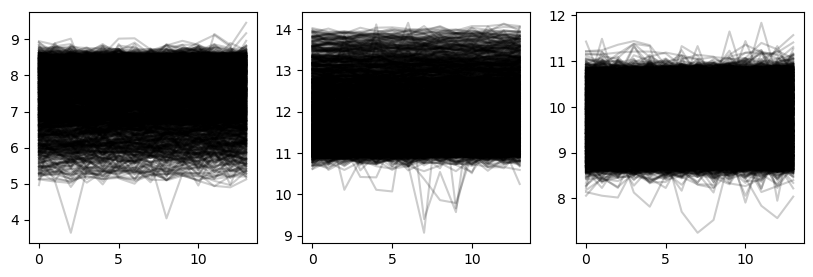

In [128]:
plt.figure(figsize=(10,3))
for yi in range(3):
    plt.subplot(1,3,1+yi)
    for xx in X[y_pred == yi]:
        plt.plot(xx.ravel(),'k-',alpha=.2)
        
plt.show()

In [142]:
tskm = TimeSeriesKMeans(n_clusters=10,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0)
y_pred = tskm.fit_predict(X)


plt.figure(figsize=(10,3))
for yi in range(3):
    plt.subplot(1,3,1+yi)
    for xx in X[y_pred == yi][0]:
        plt.plot(xx.ravel(),'k-',alpha=.2)
        
plt.show()

KeyboardInterrupt: 

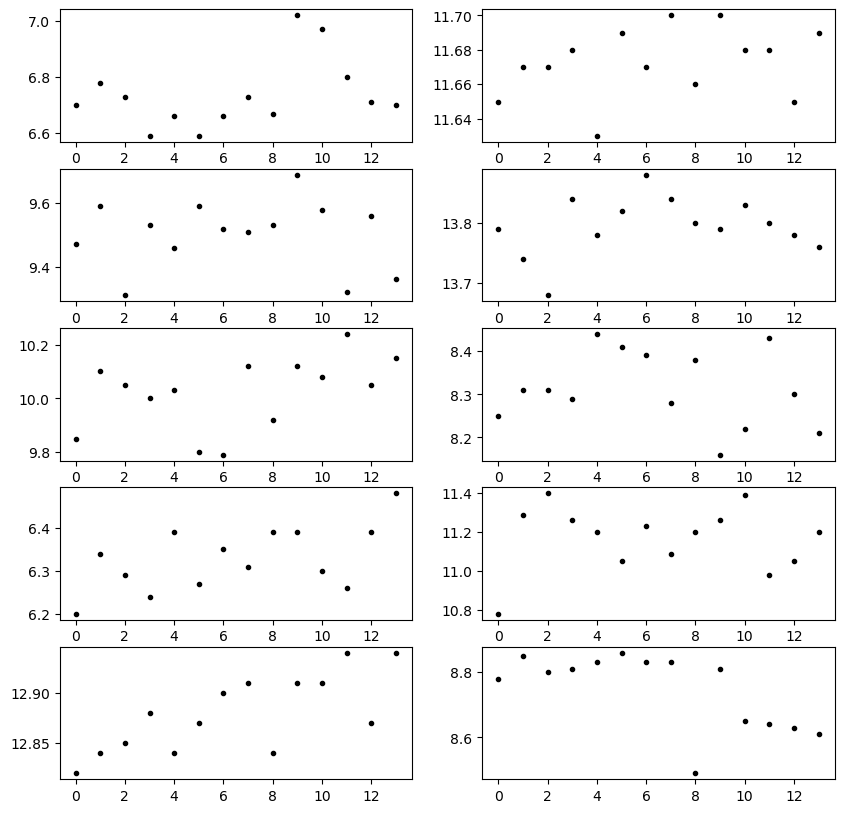

In [180]:
plt.figure(figsize=(10,10))
for yi in range(10):
    plt.subplot(5,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(X[y_pred == yi][randnum].ravel(),'k.',alpha=1)
#     print(xx.ravel())
plt.show()

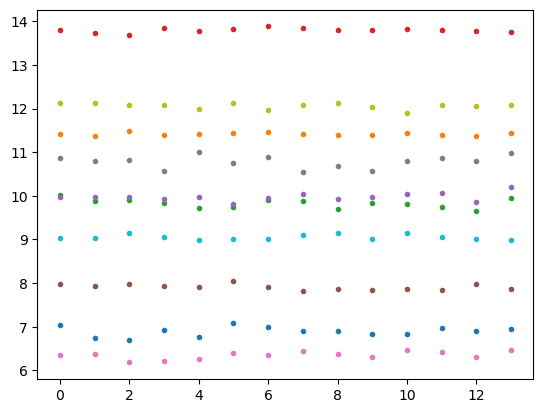

In [186]:
# all lightcurves in a plot to see the classification
plt.figure()
for yi in range(10):
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(X[y_pred == yi][randnum].ravel(),'.',alpha=1)
    
plt.show()

34.927 --> 25.974 --> 25.081 --> 24.545 --> 24.156 --> 23.745 --> 23.566 --> 23.425 --> 23.313 --> 23.228 --> 23.073 --> 22.964 --> 22.882 --> 22.813 --> 22.768 --> 22.724 --> 22.672 --> 22.628 --> 22.600 --> 22.586 --> 22.570 --> 22.546 --> 22.529 --> 22.516 --> 22.499 --> 22.489 --> 22.472 --> 22.460 --> 22.447 --> 22.431 --> 22.422 --> 22.408 --> 22.396 --> 22.390 --> 22.386 --> 22.386 --> 22.383 --> 22.379 --> 22.376 --> 22.372 --> 22.354 --> 22.312 --> 22.295 --> 22.285 --> 22.282 --> 22.278 --> 22.275 --> 22.272 --> 22.271 --> 22.264 --> 


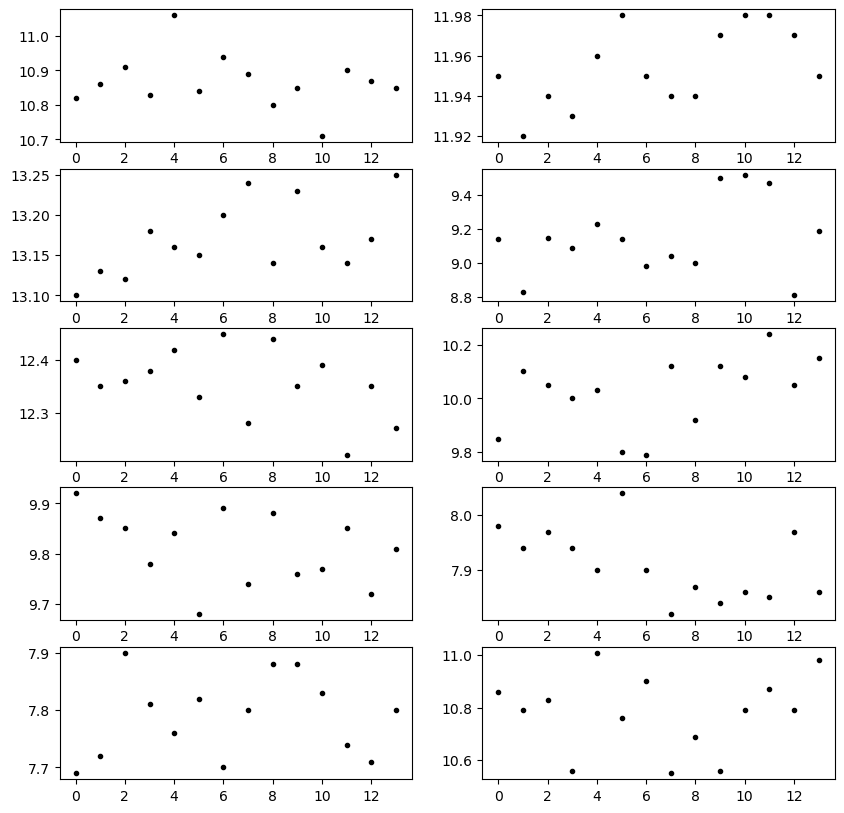

In [201]:
# normalize magnitude
wnd = []
for i in range(len(w2d)):
    wnd.append(list((w2d[i]-np.mean(w2d[i]))/np.std(w2d[i])))

Xn = to_time_series_dataset(wnd)

tskm = TimeSeriesKMeans(n_clusters=10,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0)
y_pred = tskm.fit_predict(Xn)


plt.figure(figsize=(10,10))
for yi in range(10):
    plt.subplot(5,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(Xn[y_pred == yi][randnum].ravel(),'k.',alpha=1)
#     print(xx.ravel())
plt.show()


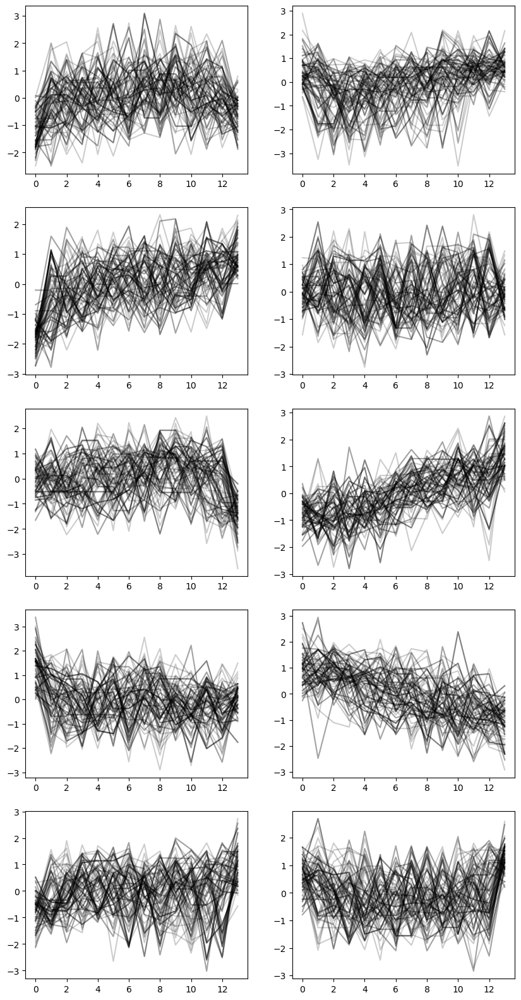

In [262]:
plt.figure(figsize=(10,20))
for yi in range(10):
    plt.subplot(5,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    for i in range(100):
        randnum = np.random.randint(100)
        plt.plot(Xn[y_pred == yi][randnum].ravel(),'k-',alpha=0.2)
#         plt.ylim(-1,1)
#     print(xx.ravel())

plt.show()


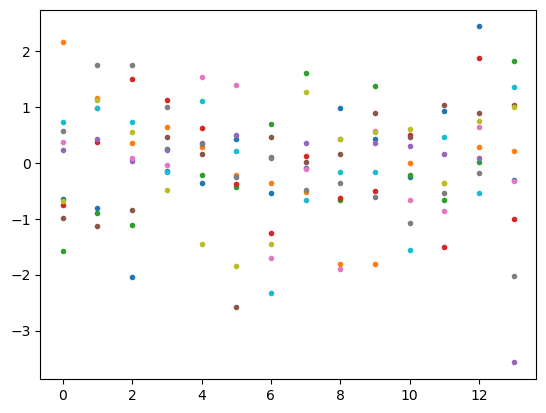

In [214]:
# all lightcurves in a plot to see the classification
plt.figure()
for yi in range(10):
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(Xn[y_pred == yi][randnum].ravel(),'.',alpha=1)
    
plt.show()

In [220]:
tskm.cluster_centers_

array([[[-1.09746702e+00],
        [ 5.46559707e-01],
        [-1.14484791e-01],
        [ 1.75480049e-01],
        [-7.56017806e-01],
        [ 7.05128028e-01],
        [-6.14787675e-02],
        [ 1.65314661e+00],
        [-3.19482714e-01],
        [ 3.83871819e-01],
        [-5.90008272e-01],
        [-2.61082179e-01],
        [-2.07235386e-01],
        [-6.13261483e-01]],

       [[ 4.58525044e-01],
        [-3.63229430e-01],
        [ 1.93647897e-01],
        [-2.15551134e+00],
        [-2.14779885e-01],
        [ 3.75722498e-01],
        [ 1.44190287e-01],
        [ 4.07716992e-01],
        [-6.60460119e-01],
        [ 4.22056975e-01],
        [ 1.18047716e+00],
        [ 4.66020878e-01],
        [ 6.96063359e-03],
        [ 6.40511713e-01]],

       [[-1.73331412e+00],
        [-1.02394334e-01],
        [-8.92292390e-01],
        [ 3.99747277e-01],
        [ 9.22437616e-01],
        [-3.26139316e-01],
        [-7.32635255e-01],
        [-4.58599650e-01],
        [ 1.04845561e+00

In [234]:
distortions = sum(np.min(cdist(Xn.squeeze(),tskm.cluster_centers_.squeeze(),
                               'euclidean'),
                         axis=1)) / Xn.shape[0]
distortions

3.4043347153005725

79.711 --> 45.062 --> 43.736 --> 43.528 --> 43.362 --> 43.178 --> 42.986 --> 42.744 --> 42.614 --> 42.534 --> 42.503 --> 42.469 --> 42.466 --> 42.444 --> 42.441 --> 42.437 --> 42.426 --> 42.420 --> 42.419 --> 42.416 --> 
65.486 --> 39.116 --> 37.737 --> 37.135 --> 36.839 --> 36.692 --> 36.637 --> 36.591 --> 36.578 --> 36.535 --> 36.516 --> 36.468 --> 36.407 --> 36.354 --> 36.339 --> 36.328 --> 36.323 --> 36.309 --> 36.303 --> 36.291 --> 
58.485 --> 34.067 --> 33.119 --> 32.790 --> 32.563 --> 32.447 --> 32.326 --> 32.265 --> 32.231 --> 32.209 --> 32.199 --> 32.181 --> 32.152 --> 32.116 --> 32.078 --> 32.056 --> 32.034 --> 32.012 --> 31.981 --> 31.973 --> 
52.217 --> 31.465 --> 30.460 --> 30.099 --> 29.811 --> 29.647 --> 29.532 --> 29.402 --> 29.303 --> 29.258 --> 29.221 --> 29.191 --> 29.163 --> 29.133 --> 29.112 --> 29.103 --> 29.090 --> 29.069 --> 29.009 --> 28.995 --> 
47.359 --> 29.528 --> 28.845 --> 28.378 --> 28.089 --> 27.871 --> 27.489 --> 27.124 --> 26.986 --> 26.912 --> 26.856

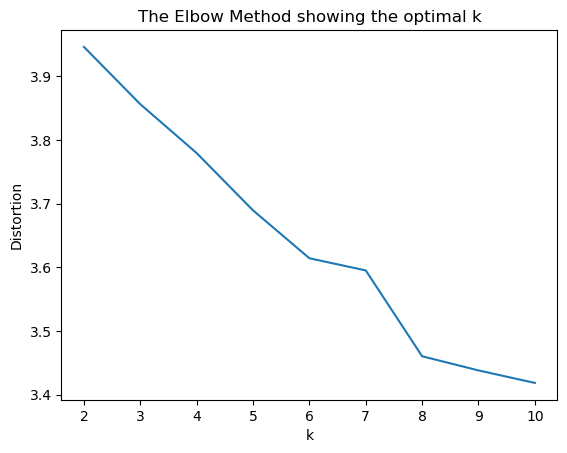

Total elapsed time : 26.23 hours


In [257]:
start_time = time.time()
distort = []
K = range(2,11)
for k in K:
    tskm = TimeSeriesKMeans(n_clusters=k,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0,
                           max_iter=20)
    tskm.fit(Xn)
    distort.append(sum(np.min(cdist(Xn.squeeze(),tskm.cluster_centers_.squeeze(),
                               'euclidean'),
                         axis=1)) / Xn.shape[0])
plt.plot(K,distort)
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

elapse = time.time() - start_time
print(f'Total elapsed time : {elapse/60:.2f} hours')

79.711 --> 45.062 --> 43.736 --> 43.528 --> 43.362 --> 43.178 --> 42.986 --> 42.744 --> 42.614 --> 42.534 --> 42.503 --> 42.469 --> 42.466 --> 42.444 --> 42.441 --> 42.437 --> 42.426 --> 42.420 --> 42.419 --> 42.416 --> 42.403 --> 42.409 --> 42.399 --> 42.405 --> 42.399 --> 42.401 --> 42.396 --> 42.399 --> 42.395 --> 42.398 --> 42.396 --> 42.398 --> 42.396 --> 42.397 --> 42.397 --> 42.397 --> 42.397 --> 42.397 --> 42.396 --> 42.396 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 42.395 --> 
65.486 --> 39.116 --> 37.737 --> 37.135 --> 36.839 --> 36.692 --> 36.637 --> 36.591 --> 36.578 --> 36.535 --> 36.516 --> 36.468 --> 36.407 --> 36.354 --> 36.339 --> 36.328 --> 36.323 --> 36.309 --> 36.303 --> 36.291 --> 36.291 --> 36.281 --> 36.280 --> 36.274 --> 36.273 --> 36.265 --> 36.265 --> 36.259 --> 36.261 --> 36.252 --> 36.252 --> 36.244 --> 36.245 --> 36.241 --> 36.236 --> 36.233 --> 36.235 --> 36.232 --> 36.233 --> 36.233 --> 36.231 --

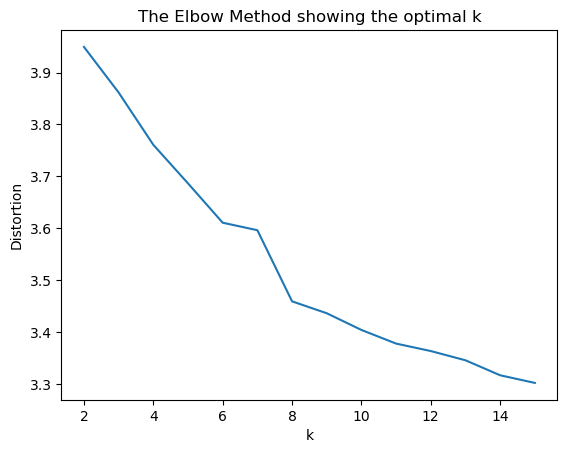

Total elapsed time : 109.81


In [264]:
# k=15, normal iteration

start_time = time.time()
distort = []
K = range(2,16)
for k in K:
    tskm = TimeSeriesKMeans(n_clusters=k,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0,
                           #max_iter=20,
                           )
    tskm.fit(Xn)
    # distortion : 같은 클러스터에 속하는 각각의 점들로부터 그 클러스터의 평균과의 거리의 합을 제곱한 함수
    distort.append(sum(np.min(cdist(Xn.squeeze(),tskm.cluster_centers_.squeeze(),  
                               'euclidean'),
                         axis=1)) / Xn.shape[0])
plt.plot(K,distort)
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

elapse = time.time() - start_time
print(f'Total elapsed time : {elapse/60:.2f}')

39.465 --> 27.969 --> 27.060 --> 26.580 --> 26.119 --> 25.779 --> 25.500 --> 25.256 --> 24.977 --> 24.827 --> 24.694 --> 24.628 --> 24.584 --> 24.547 --> 24.511 --> 24.458 --> 24.426 --> 24.408 --> 24.380 --> 24.363 --> 24.339 --> 24.318 --> 24.292 --> 24.276 --> 24.251 --> 24.231 --> 24.167 --> 24.147 --> 24.108 --> 24.087 --> 24.071 --> 24.058 --> 24.041 --> 24.033 --> 24.025 --> 24.019 --> 24.010 --> 24.009 --> 24.004 --> 24.002 --> 23.996 --> 23.991 --> 23.987 --> 23.983 --> 23.978 --> 23.975 --> 23.972 --> 23.970 --> 23.968 --> 23.961 --> 


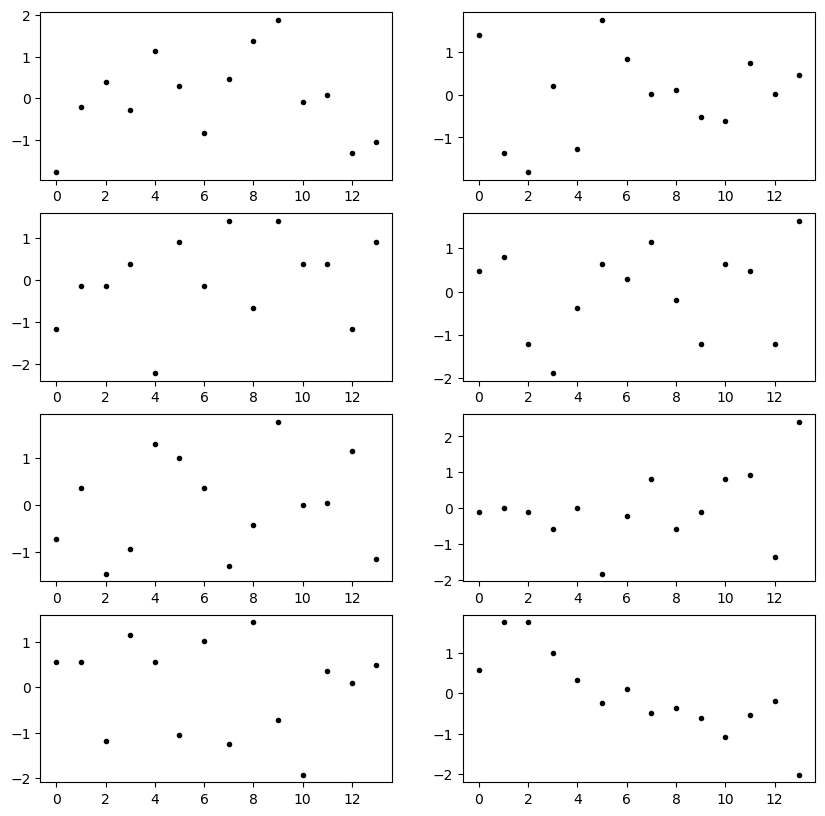

In [265]:
# scree plot elbow is k=8 - let's see the result of k=8 clusters 
wnd = []
for i in range(len(w2d)):
    wnd.append(list((w2d[i]-np.mean(w2d[i]))/np.std(w2d[i])))

Xn = to_time_series_dataset(wnd)

tskm = TimeSeriesKMeans(n_clusters=8,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0)
y_pred = tskm.fit_predict(Xn)


plt.figure(figsize=(10,10))
for yi in range(8):
    plt.subplot(4,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(Xn[y_pred == yi][randnum].ravel(),'k.',alpha=1)
#     print(xx.ravel())
plt.show()

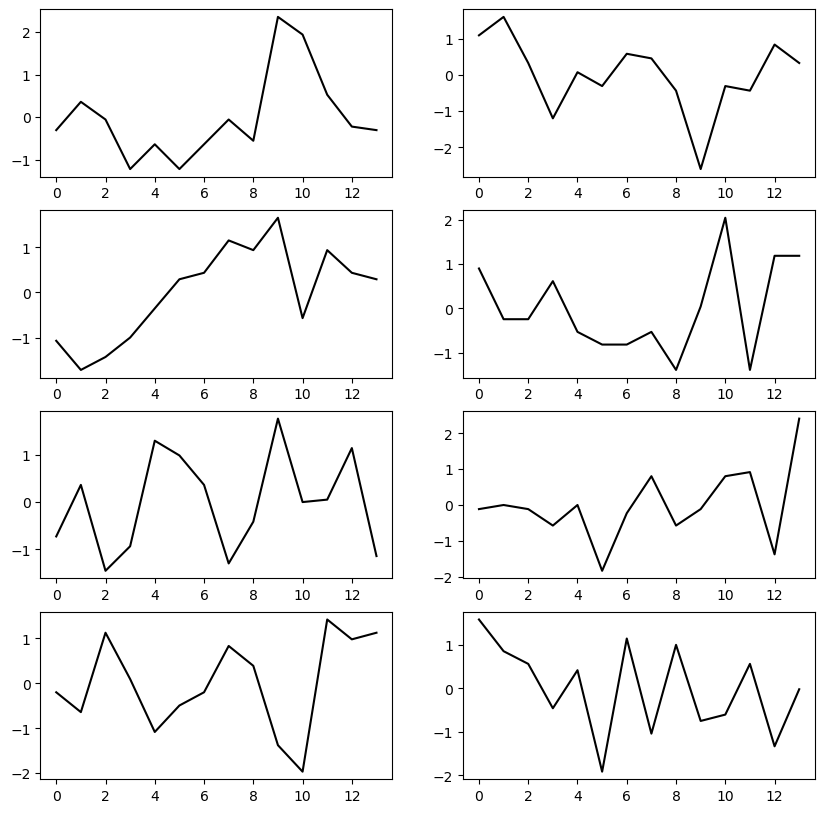

In [270]:
plt.figure(figsize=(10,10))
for yi in range(8):
    plt.subplot(4,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(Xn[y_pred == yi][randnum].ravel(),'k-',alpha=1)
#     print(xx.ravel())
plt.show()

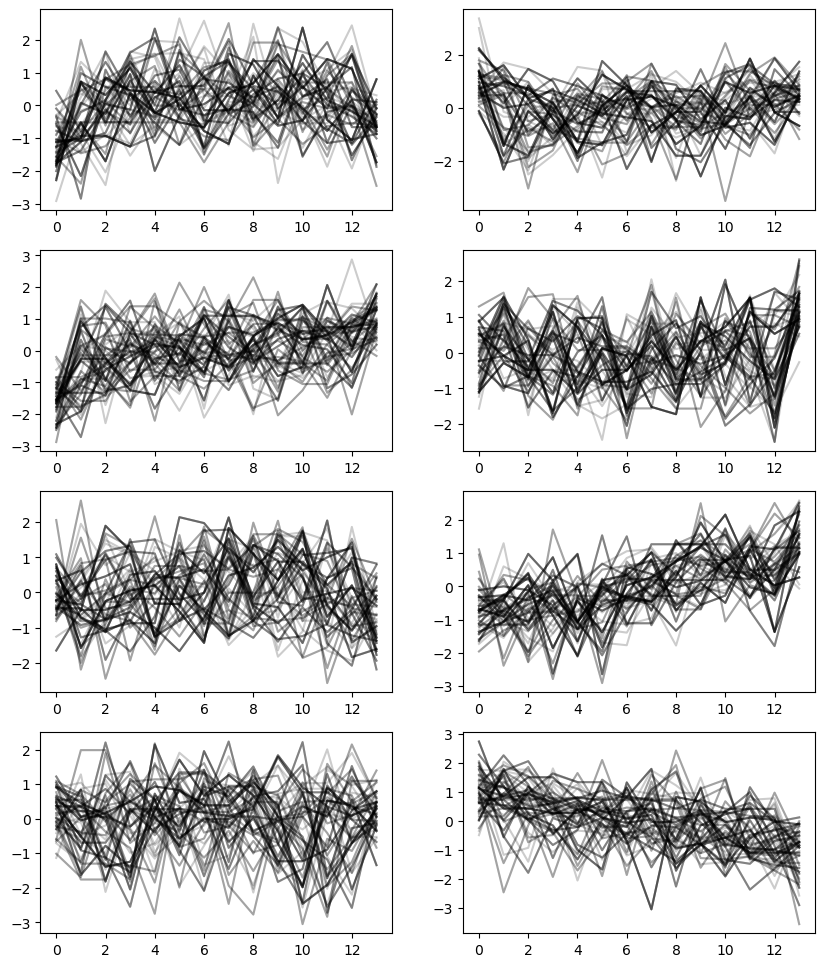

In [269]:
plt.figure(figsize=(10,12))
for yi in range(8):
    plt.subplot(4,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    for i in range(100):
        randnum = np.random.randint(50)
        plt.plot(Xn[y_pred == yi][randnum].ravel(),'k-',alpha=0.2)
#     print(xx.ravel())
plt.show()

    

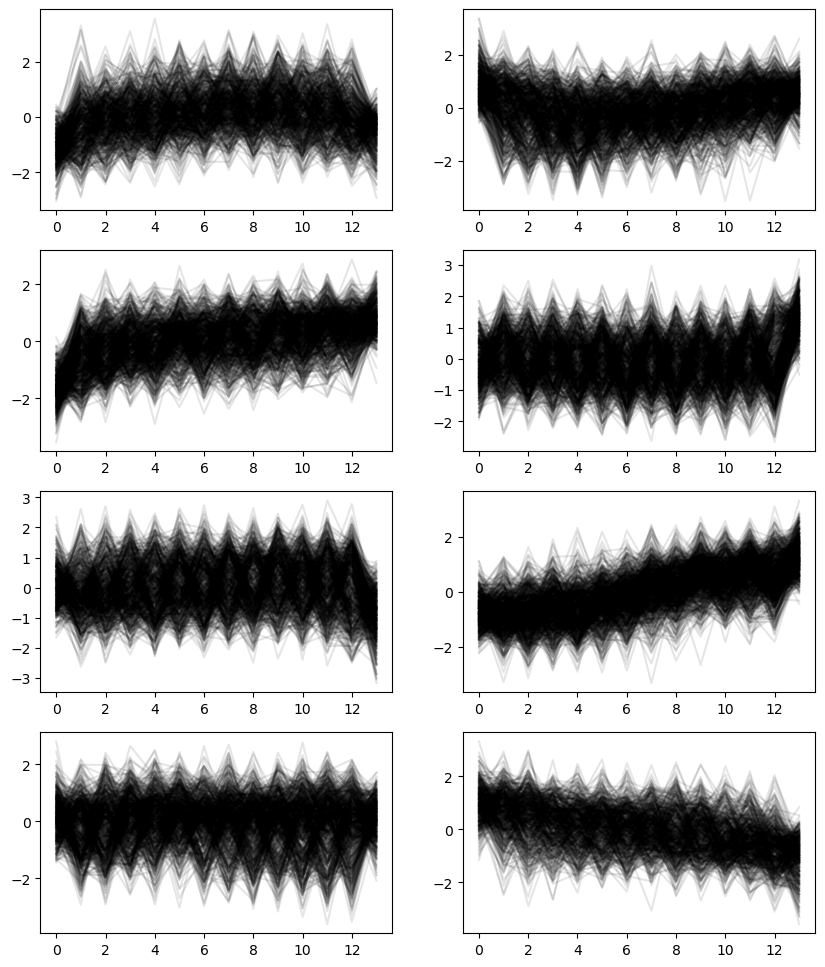

In [273]:
plt.figure(figsize=(10,12))
for yi in range(8):
    plt.subplot(4,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    for i in range(len(Xn[y_pred == yi])):
#         randnum = np.random.randint(50)
        plt.plot(Xn[y_pred == yi][i].ravel(),'k-',alpha=0.1)
#     print(xx.ravel())
plt.show()


### 정규화를 진행하니 밝기 차이라던지 스케일 차이가 보이지 않는다.
### 정규화 하지말고 mean 값만 0으로 통일시켜 보자. 

In [277]:
# mean magnitude into 0
wzero = []
for i in range(len(w2d)):
    wzero.append(list(w2d[i]-np.mean(w2d[i])))

Xz = to_time_series_dataset(wzero)

tskm = TimeSeriesKMeans(n_clusters=10,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=0,
                           max_iter=10)
y_pred = tskm.fit_predict(Xz)


plt.figure(figsize=(10,10))
for yi in range(10):
    plt.subplot(5,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    randnum = np.random.randint(10)
    plt.plot(Xz[y_pred == yi][randnum].ravel(),'k.',alpha=1)
#     print(xx.ravel())
plt.show()

0.093 --> 0.078 --> 0.073 --> 0.071 --> 0.071 --> 0.073 --> 0.074 --> 0.075 --> 0.076 --> 0.076 --> 


IndexError: index 4 is out of bounds for axis 0 with size 2

In [295]:
Xz[y_pred == 3][0]

array([[-0.67571429],
       [-0.73571429],
       [-0.77571429],
       [-0.49571429],
       [-0.58571429],
       [-0.60571429],
       [-0.72571429],
       [-0.56571429],
       [-0.62571429],
       [ 0.89428571],
       [ 0.92428571],
       [ 1.33428571],
       [ 1.45428571],
       [ 1.18428571]])

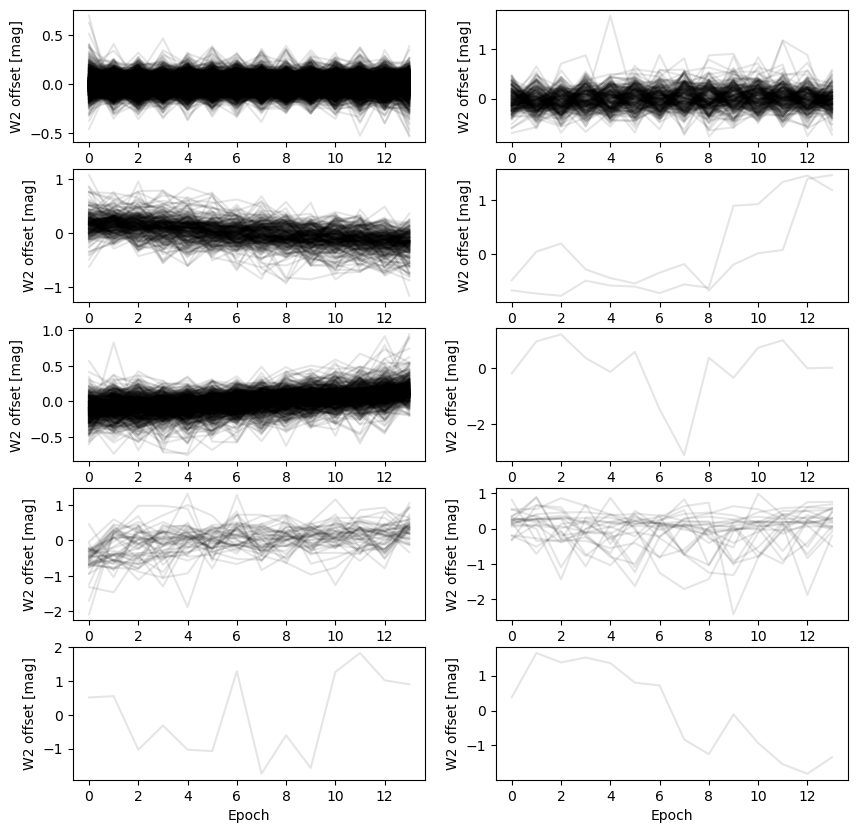

In [302]:
plt.figure(figsize=(10,10))
for yi in range(10):
    plt.subplot(5,2,1+yi)
#     for xx in X[y_pred == yi][0]:
    for i in range(len(Xz[y_pred == yi])):
#         randnum = np.random.randint(50)
        plt.plot(Xz[y_pred == yi][i].ravel(),'k-',alpha=0.1)
        plt.xlabel('Epoch')
        plt.ylabel('W2 offset [mag]')
#     print(xx.ravel())
plt.show()

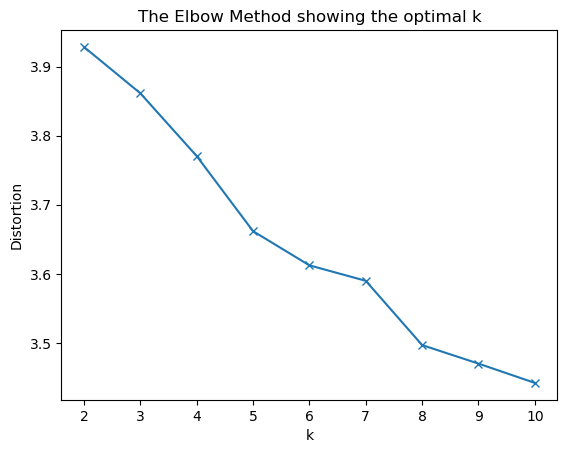

In [239]:
plt.plot(K,distort,'x-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [240]:
?tskm.fit_predict